In [1]:
### v2.1

In [1]:
## ignore these cells

In [2]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from td_utils import *
%matplotlib inline

In [14]:
### THIS CELL IS NOT EDITABLE

# UNIT TEST
def is_overlapping_test(target):
    assert target((670, 1430), []) == False, "Overlap with an empty list must be False"
    assert target((500, 1000), [(100, 499), (1001, 1100)]) == False, "Almost overlap, but still False"
    assert target((750, 900), [(100, 750), (1001, 1100)]) == True, "Must overlap with the end of first segment"
    assert target((750, 1250), [(300, 600), (1250, 1500)]) == True, "Must overlap with the beginning of second segment"
    assert target((750, 1250), [(300, 600), (600, 1500), (1600, 1800)]) == True, "Is contained in second segment"
    assert target((800, 1100), [(300, 600), (900, 1000), (1600, 1800)]) == True, "New segment contains the second segment"

    print("\033[92m All tests passed!")
    
is_overlapping_test(is_overlapping)

 All tests passed!


In [17]:
### THIS CELL IS NOT EDITABLE

# UNIT TEST
def insert_audio_clip_test(target):
    np.random.seed(5)
    audio_clip, segment_time = target(backgrounds[0], activates[0], [(0, 4400)])
    duration = segment_time[1] - segment_time[0]
    #print(f"xx: {segment_time}")
    assert segment_time[0] > 4400, "Error: The audio clip is overlapping with the first segment"
    assert duration + 1 == len(activates[0]) , "The segment length must match the audio clip length"
    assert audio_clip != backgrounds[0] , "The audio clip must be different than the pure background"
    assert segment_time == (7286, 8201), f"Wrong segment. Expected: (7286, 8201) got:{segment_time}"
    
    # Not possible to insert clip into background
    audio_clip, segment_time = target(backgrounds[0], activates[0], [(0, 9999)])
    assert segment_time == (10000, 10000), "Segment must match the out by max-retry mark"
    assert audio_clip == backgrounds[0], "output audio clip must be exactly the same input background"
    
    print("\033[92m All tests passed!")

insert_audio_clip_test(insert_audio_clip)

 All tests passed!


In [21]:
### THIS CELL IS NOT EDITABLE

# UNIT TEST
import random
def insert_ones_test(target):
    segment_end_y = random.randrange(0, Ty - 50) 
    segment_end_ms = int(segment_end_y * 10000.4) / Ty;    
    arr1 = target(np.zeros((1, Ty)), segment_end_ms)

    assert type(arr1) == np.ndarray, "Wrong type. Output must be a numpy array"
    assert arr1.shape == (1, Ty), "Wrong shape. It must match the input shape"
    assert np.sum(arr1) == 50, "It must insert exactly 50 ones"
    assert arr1[0][segment_end_y - 1] == 0, f"Array at {segment_end_y - 1} must be 0"
    assert arr1[0][segment_end_y] == 0, f"Array at {segment_end_y} must be 0"
    assert arr1[0][segment_end_y + 1] == 1, f"Array at {segment_end_y + 1} must be 1"
    assert arr1[0][segment_end_y + 50] == 1, f"Array at {segment_end_y + 50} must be 1"
    assert arr1[0][segment_end_y + 51] == 0, f"Array at {segment_end_y + 51} must be 0"
    
    arr1 = target(np.zeros((1, Ty)), 9632)
    assert np.sum(arr1) == 50, f"Expected sum of 50, but got {np.sum(arr1)}"
    arr1 = target(np.zeros((1, Ty)), 9637)
    assert np.sum(arr1) == 49, f"Expected sum of 49, but got {np.sum(arr1)}"
    arr1 = target(np.zeros((1, Ty)), 10008)
    assert np.sum(arr1) == 0, f"Expected sum of 0, but got {np.sum(arr1)}"
    arr1 = target(np.zeros((1, Ty)), 10000)
    assert np.sum(arr1) == 0, f"Expected sum of 0, but got {np.sum(arr1)}"
    arr1 = target(np.zeros((1, Ty)), 9996)
    assert np.sum(arr1) == 0, f"Expected sum of 0, but got {np.sum(arr1)}"
    arr1 = target(np.zeros((1, Ty)), 9990)
    assert np.sum(arr1) == 1, f"Expected sum of 1, but got {np.sum(arr1)}"
    arr1 = target(np.zeros((1, Ty)), 9980)
    assert np.sum(arr1) == 2, f"Expected sum of 2, but got {np.sum(arr1)}"

    print("\033[92m All tests passed!")
    
insert_ones_test(insert_ones)

 All tests passed!


sanity checks: 0.0 1.0 0.0


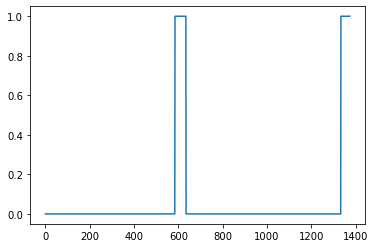

In [22]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])

 All tests passed!


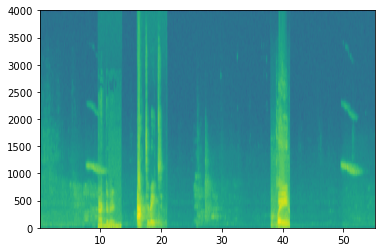

In [24]:
### THIS CELL IS NOT EDITABLE

# UNIT TEST
def create_training_example_test(target):
    np.random.seed(18)
    x, y = target(backgrounds[0], activates, negatives, 1375)
    
    assert type(x) == np.ndarray, "Wrong type for x"
    assert type(y) == np.ndarray, "Wrong type for y"
    assert tuple(x.shape) == (101, 5511), "Wrong shape for x"
    assert tuple(y.shape) == (1, 1375), "Wrong shape for y"
    assert np.all(x > 0), "All x values must be higher than 0"
    assert np.all(y >= 0), "All y values must be higher or equal than 0"
    assert np.all(y <= 1), "All y values must be smaller or equal than 1"
    assert np.sum(y) >= 50, "It must contain at least one activate"
    assert np.sum(y) % 50 == 0, "Sum of activate marks must be a multiple of 50"
    assert np.isclose(np.linalg.norm(x), 39745552.52075), "Spectrogram is wrong. Check the parameters passed to the insert_audio_clip function"

    print("\033[92m All tests passed!")

create_training_example_test(create_training_example)

<a name='2'></a>
## 2 - The Model

* Now that you've built a dataset, let's write and train a trigger word detection model! 
* The model will use 1-D convolutional layers, GRU layers, and dense layers. 
* Let's load the packages that will allow you to use these layers in Keras. This might take a minute to load. 

In [32]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam

<a name='2-1'></a>
### 2.1 - Build the Model

Our goal is to build a network that will ingest a spectrogram and output a signal when it detects the trigger word. This network will use 4 layers:
    * A convolutional layer
    * Two GRU layers
    * A dense layer. 

Here is the architecture we will use.

<img src="images/model.png" style="width:600px;height:600px;">
<center> **Figure 3** </center>

##### 1D convolutional layer
One key layer of this model is the 1D convolutional step (near the bottom of Figure 3). 
* It inputs the 5511 step spectrogram.  Each step is a vector of 101 units.
* It outputs a 1375 step output
* This output is further processed by multiple layers to get the final $T_y = 1375$ step output. 
* This 1D convolutional layer plays a role similar to the 2D convolutions you saw in Course 4, of extracting low-level features and then possibly generating an output of a smaller dimension. 
* Computationally, the 1-D conv layer also helps speed up the model because now the GRU  can process only 1375 timesteps rather than 5511 timesteps. 

##### GRU, dense and sigmoid
* The two GRU layers read the sequence of inputs from left to right.
* A dense plus sigmoid layer makes a prediction for $y^{\langle t \rangle}$. 
* Because $y$ is a binary value (0 or 1), we use a sigmoid output at the last layer to estimate the chance of the output being 1, corresponding to the user having just said "activate".

#### Unidirectional RNN
* Note that we use a **unidirectional RNN** rather than a bidirectional RNN. 
* This is really important for trigger word detection, since we want to be able to detect the trigger word almost immediately after it is said. 
* If we used a bidirectional RNN, we would have to wait for the whole 10sec of audio to be recorded before we could tell if "activate" was said in the first second of the audio clip.  

#### Implement the model

In the following model, the input of each layer is the output of the previous one. Implementing the model can be done in four steps. 

**Step 1**: CONV layer. Use `Conv1D()` to implement this, with 196 filters, 
a filter size of 15 (`kernel_size=15`), and stride of 4. [conv1d](https://keras.io/layers/convolutional/#conv1d)

```Python
output_x = Conv1D(filters=...,kernel_size=...,strides=...)(input_x)
```
* Follow this with batch normalization.  No parameters need to be set.

```Python
output_x = BatchNormalization()(input_x)
```
* Follow this with a ReLu activation.  Note that we can pass in the name of the desired activation as a string, all in lowercase letters.

```Python
output_x = Activation("...")(input_x)
```

* Follow this with dropout, using a rate of 0.8 

```Python
output_x = Dropout(rate=...)(input_x)
```


**Step 2**: First GRU layer. To generate the GRU layer, use 128 units.
```Python
output_x = GRU(units=..., return_sequences = ...)(input_x)
```
* Return sequences instead of just the last time step's prediction to ensure that all the GRU's hidden states are fed to the next layer. 
* Follow this with dropout, using a rate of 0.8.
* Follow this with batch normalization.  No parameters need to be set.
```Python
output_x = BatchNormalization()(input_x)
```

**Step 3**: Second GRU layer. This has the same specifications as the first GRU layer.
* Follow this with a dropout, batch normalization, and then another dropout.

**Step 4**: Create a time-distributed dense layer as follows: 
```Python
output_x = TimeDistributed(Dense(1, activation = "sigmoid"))(input_x)
```
This creates a dense layer followed by a sigmoid, so that the parameters used for the dense layer are the same for every time step.  
Documentation:
* [Keras documentation on wrappers](https://keras.io/layers/wrappers/).  
* To learn more, you can read this blog post [How to Use the TimeDistributed Layer in Keras](https://machinelearningmastery.com/timedistributed-layer-for-long-short-term-memory-networks-in-python/).

<a name='ex-5'></a>
### Exercise 5 - modelf

Implement `modelf()`, the architecture is presented in Figure 3.

In [35]:
# UNQ_C5
# GRADED FUNCTION: modelf

def modelf(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    ### START CODE HERE ###
    
    # Step 1: CONV layer (≈4 lines)
    # Add a Conv1D with 196 units, kernel size of 15 and stride of 4
    X = Conv1D(filters = 196, kernel_size = 15, strides = 4)(X_input)
    # Batch normalization
    X = BatchNormalization()(X)
    # ReLu activation
    X = Activation('relu')(X)
    # dropout (use 0.8)
    X = Dropout(0.8)(X)                  

    # Step 2: First GRU Layer (≈4 lines)
    # GRU (use 128 units and return the sequences)
    X = GRU(units = 128, return_sequences = True)(X)
    # dropout (use 0.8)
    X = Dropout(0.8)(X)
    # Batch normalization.
    X = BatchNormalization()(X)                   
    
    # Step 3: Second GRU Layer (≈4 lines)
    # GRU (use 128 units and return the sequences)
    X = GRU(units = 128, return_sequences = True)(X)
    # dropout (use 0.8)
    X = Dropout(0.8)(X)  
    # Batch normalization
    X = BatchNormalization()(X)
    # dropout (use 0.8)
    X = Dropout(0.8)(X)                                   
    
    # Step 4: Time-distributed dense layer (≈1 line)
    # TimeDistributed  with sigmoid activation 
    X = TimeDistributed(Dense(1, activation = 'sigmoid'))(X)

    ### END CODE HERE ###

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [36]:
### THIS CELL IS NOT EDITABLE

# UNIT TEST
from test_utils import *

def modelf_test(target):
    Tx = 5511
    n_freq = 101
    model = target(input_shape = (Tx, n_freq))
    expected_model = [['InputLayer', [(None, 5511, 101)], 0],
                     ['Conv1D', (None, 1375, 196), 297136, 'valid', 'linear', (4,), (15,), 'GlorotUniform'],
                     ['BatchNormalization', (None, 1375, 196), 784],
                     ['Activation', (None, 1375, 196), 0],
                     ['Dropout', (None, 1375, 196), 0, 0.8],
                     ['GRU', (None, 1375, 128), 125184, True],
                     ['Dropout', (None, 1375, 128), 0, 0.8],
                     ['BatchNormalization', (None, 1375, 128), 512],
                     ['GRU', (None, 1375, 128), 99072, True],
                     ['Dropout', (None, 1375, 128), 0, 0.8],
                     ['BatchNormalization', (None, 1375, 128), 512],
                     ['Dropout', (None, 1375, 128), 0, 0.8],
                     ['TimeDistributed', (None, 1375, 1), 129, 'sigmoid']]
    comparator(summary(model), expected_model)
    
    
modelf_test(modelf)

All tests passed!


In [37]:
model = modelf(input_shape = (Tx, n_freq))

Let's print the model summary to keep track of the shapes.

In [38]:
model.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_3 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_1 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 1375, 196)         0         
_________________________________________________________________
gru_2 (GRU)                  (None, 1375, 128)         125184    
_________________________________________________________________
dropout_5 (Dropout)          (None, 1375, 128)        

**Expected Output**:

<table>
    <tr>
        <td>
            **Total params**
        </td>
        <td>
           523,329
        </td>
    </tr>
    <tr>
        <td>
            **Trainable params**
        </td>
        <td>
           522,425
        </td>
    </tr>
    <tr>
        <td>
            **Non-trainable params**
        </td>
        <td>
           904
        </td>
    </tr>
</table>

The output of the network is of shape (None, 1375, 1) while the input is (None, 5511, 101). The Conv1D has reduced the number of steps from 5511 to 1375. 

<a name='2-2'></a>
### 2.2 - Fit the Model

* Trigger word detection takes a long time to train. 
* To save time, we've already trained a model for about 3 hours on a GPU using the architecture you built above, and a large training set of about 4000 examples. 
* Let's load the model. 

In [39]:
from tensorflow.keras.models import model_from_json

json_file = open('./models/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('./models/model.h5')

<a name='2-2-1'></a>
#### 2.2.1 Block Training for BatchNormalization Layers

If you are going to fine-tune a pretrained model, it is important that you block the weights of all your batchnormalization layers. If you are going to train a new model from scratch, skip the next cell. 

In [40]:
model.layers[2].trainable = False
model.layers[7].trainable = False
model.layers[10].trainable = False

You can train the model further, using the Adam optimizer and binary cross entropy loss, as follows. This will run quickly because we are training just for two epochs and with a small training set of 32 examples. 

In [41]:
opt = Adam(lr=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [42]:
model.fit(X, Y, batch_size = 16, epochs=1)

2/2 [==============================] - 3s 2s/step - loss: 0.1609 - accuracy: 0.9506


<a name='2-3'></a>
### 2.3 - Test the Model

Finally, let's see how your model performs on the dev set.

In [43]:
loss, acc, = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 0s 1ms/step - loss: 0.1887 - accuracy: 0.9239
Dev set accuracy =  0.9238981604576111


This looks pretty good! 
* However, accuracy isn't a great metric for this task
    * Since the labels are heavily skewed to 0's, a neural network that just outputs 0's would get slightly over 90% accuracy. 
* We could define more useful metrics such as F1 score or Precision/Recall. 
    * Let's not bother with that here, and instead just empirically see how the model does with some predictions.

<a name='3'></a>
## 3 - Making Predictions

Now that you have built a working model for trigger word detection, let's use it to make predictions. This code snippet runs audio (saved in a wav file) through the network. 

<!--
can use your model to make predictions on new audio clips.

You will first need to compute the predictions for an input audio clip.

**Exercise**: Implement predict_activates(). You will need to do the following:

1. Compute the spectrogram for the audio file
2. Use `np.swap` and `np.expand_dims` to reshape your input to size (1, Tx, n_freqs)
5. Use forward propagation on your model to compute the prediction at each output step
!-->

In [44]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    # Correct the amplitude of the input file before prediction 
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    file_handle = audio_clip.export("tmp.wav", format="wav")
    filename = "tmp.wav"

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

#### Insert a chime to acknowledge the "activate" trigger
* Once you've estimated the probability of having detected the word "activate" at each output step, you can trigger a "chiming" sound to play when the probability is above a certain threshold. 
* $y^{\langle t \rangle}$ might be near 1 for many values in a row after "activate" is said, yet we want to chime only once. 
    * So we will insert a chime sound at most once every 75 output steps. 
    * This will help prevent us from inserting two chimes for a single instance of "activate". 
    * This plays a role similar to non-max suppression from computer vision.

<!-- 
**Exercise**: Implement chime_on_activate(). You will need to do the following:

1. Loop over the predicted probabilities at each output step
2. When the prediction is larger than the threshold and more than 75 consecutive time steps have passed, insert a "chime" sound onto the original audio clip

Use this code to convert from the 1,375 step discretization to the 10,000 step discretization and insert a "chime" using pydub:

` audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio.duration_seconds)*1000)
`
!--> 

In [45]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Step 1: Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    i = 0
    # Step 2: Loop over the output steps in the y
    while i < Ty:
        # Step 3: Increment consecutive output steps
        consecutive_timesteps += 1
        # Step 4: If prediction is higher than the threshold for 20 consecutive output steps have passed
        if consecutive_timesteps > 20:
            # Step 5: Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds) * 1000)
            # Step 6: Reset consecutive output steps to 0
            consecutive_timesteps = 0
            i = 75 * (i // 75 + 1)
            continue
        # if amplitude is smaller than the threshold reset the consecutive_timesteps counter
        if predictions[0, i, 0] < threshold:
            consecutive_timesteps = 0
        i += 1
        
    audio_clip.export("chime_output.wav", format='wav')

<a name='3-1'></a>
### 3.1 - Test on Dev Examples

Let's explore how our model performs on two unseen audio clips from the development set. Lets first listen to the two dev set clips. 

In [46]:
IPython.display.Audio("./raw_data/dev/1.wav")

In [47]:
IPython.display.Audio("./raw_data/dev/2.wav")

Now lets run the model on these audio clips and see if it adds a chime after "activate"!

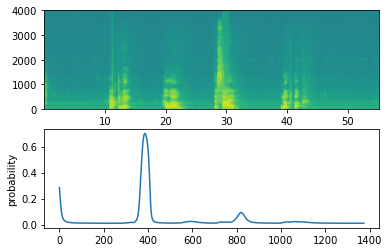

In [48]:
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

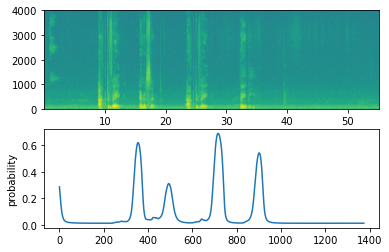

In [49]:
filename  = "./raw_data/dev/2.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

### Congratulations 

You've come to the end of this assignment! 

#### Here's what you should remember:
- Data synthesis is an effective way to create a large training set for speech problems, specifically trigger word detection. 
- Using a spectrogram and optionally a 1D conv layer is a common pre-processing step prior to passing audio data to an RNN, GRU or LSTM.
- An end-to-end deep learning approach can be used to build a very effective trigger word detection system. 

*Congratulations* on finishing this assignment!

<a name='4'></a>
## 4 - Try Your Own Example! (OPTIONAL/UNGRADED)

In this optional and ungraded portion of this notebook, you can try your model on your own audio clips! 

* Record a 10 second audio clip of you saying the word "activate" and other random words, and upload it to the Coursera hub as `myaudio.wav`. 
* Be sure to upload the audio as a wav file. 
* If your audio is recorded in a different format (such as mp3) there is free software that you can find online for converting it to wav. 
* If your audio recording is not 10 seconds, the code below will either trim or pad it as needed to make it 10 seconds. 

In [50]:
# Preprocess the audio to the correct format
def preprocess_audio(filename):
    # Trim or pad audio segment to 10000ms
    padding = AudioSegment.silent(duration=10000)
    segment = AudioSegment.from_wav(filename)[:10000]
    segment = padding.overlay(segment)
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

Once you've uploaded your audio file to Coursera, put the path to your file in the variable below.

In [51]:
your_filename = "audio_examples/my_audio.wav"

In [52]:
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio you uploaded 

Finally, use the model to predict when you say activate in the 10 second audio clip, and trigger a chime. If beeps are not being added appropriately, try to adjust the chime_threshold.

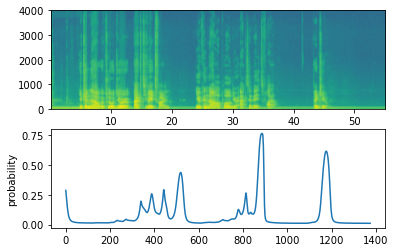

In [53]:
chime_threshold = 0.5
prediction = detect_triggerword(your_filename)
chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio("./chime_output.wav")